In [1]:
# Checking system version - Diagnostic
import sys
print(sys.version)

3.11.4 | packaged by Anaconda, Inc. | (main, Jul  5 2023, 13:47:18) [MSC v.1916 64 bit (AMD64)]


In [2]:
# Supressing all warnings
import warnings
warnings.filterwarnings('ignore')

In [46]:
import datetime as dt
import yfinance as yf
import pandas as pd
import matplotlib.pyplot as plt
import talib
import copy
import time
from stocktrends import Renko
import statsmodels.api as sm
import numpy as np

In [4]:
# Display certain rows and columns for any dataframe
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
# Suppress scientific notation
pd.options.display.float_format = '{:.8f}'.format

## Initial Data Exploration

In [6]:
stocks = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]
start = dt.datetime.today()-dt.timedelta(3650)
end = dt.datetime.today()

# empty dataframe which will be filled with closing prices of each stock
cl_price = pd.DataFrame() 

2 ways to deal with NaN values:

Method 1 - Fill NaN values with some data

```cl_price.fillna(method='bfill',axis=0,inplace=True)```

Method 2 - Drop/Remove particular NaN values

```cl_price.dropna(axis=0,how='any')```

In [7]:
# looping over tickers and creating a dataframe with close prices
for ticker in stocks:
    cl_price[ticker] = yf.download(ticker,start,end)["Adj Close"]

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [8]:
cl_price

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,26.69678116,15.22887897,41.86999893,14.43999958,16.53214645,17.17885017,28.69377136,116.27135468,50.26653290,11.26266670
2013-09-04,26.12733650,15.54399872,41.77999878,14.68200016,16.95911789,17.39103508,29.17397881,115.74671173,50.66565323,11.37466717
2013-09-05,26.15245819,15.43740654,42.65999985,14.70499992,16.92915154,17.33250237,29.08666229,116.39144897,51.07983017,11.32866669
2013-09-06,26.08546829,15.52935600,43.95000076,14.79300022,16.98158836,17.23007011,28.89957237,115.68354034,51.22291565,11.13133335
2013-09-09,26.51254845,15.77715683,44.04000092,14.98550034,17.16136742,17.50077820,28.63140297,116.91603851,52.18682480,10.71333313
2013-09-10,27.12385750,15.41777134,43.59999847,15.01799965,17.21380234,17.67637062,28.98065567,117.93991089,52.78172302,11.09133339
2013-09-11,27.41695595,14.57837009,45.04000092,14.98200035,17.08645821,17.83732986,29.01182556,120.53137970,51.27561569,10.90133286
2013-09-12,27.37509155,14.73359966,44.75000000,14.94299984,16.95162773,17.77147865,29.52945137,120.55031586,51.81783295,10.99533272
2013-09-13,27.65980148,14.49078655,44.31000137,14.89599991,17.55838203,17.79343414,29.78515434,121.46048737,51.64462280,11.03600025


In [9]:
# filling NaN values
cl_price.dropna(axis=0,how='any',inplace=True)

In [10]:
cl_price

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,26.69678116,15.22887897,41.86999893,14.43999958,16.53214645,17.17885017,28.69377136,116.27135468,50.26653290,11.26266670
2013-09-04,26.12733650,15.54399872,41.77999878,14.68200016,16.95911789,17.39103508,29.17397881,115.74671173,50.66565323,11.37466717
2013-09-05,26.15245819,15.43740654,42.65999985,14.70499992,16.92915154,17.33250237,29.08666229,116.39144897,51.07983017,11.32866669
2013-09-06,26.08546829,15.52935600,43.95000076,14.79300022,16.98158836,17.23007011,28.89957237,115.68354034,51.22291565,11.13133335
2013-09-09,26.51254845,15.77715683,44.04000092,14.98550034,17.16136742,17.50077820,28.63140297,116.91603851,52.18682480,10.71333313
2013-09-10,27.12385750,15.41777134,43.59999847,15.01799965,17.21380234,17.67637062,28.98065567,117.93991089,52.78172302,11.09133339
2013-09-11,27.41695595,14.57837009,45.04000092,14.98200035,17.08645821,17.83732986,29.01182556,120.53137970,51.27561569,10.90133286
2013-09-12,27.37509155,14.73359966,44.75000000,14.94299984,16.95162773,17.77147865,29.52945137,120.55031586,51.81783295,10.99533272
2013-09-13,27.65980148,14.49078655,44.31000137,14.89599991,17.55838203,17.79343414,29.78515434,121.46048737,51.64462280,11.03600025


In [11]:
# Viewing summary of each columns
cl_price.describe()

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
count,2515.00000000,2515.00000000,2515.00000000,2515.00000000,2515.00000000,2515.00000000,2515.00000000,2515.00000000,2515.00000000,2515.00000000
mean,134.31354237,70.46999654,169.05440957,80.32149836,36.13922386,34.70819306,39.93265818,111.65744962,78.79782349,86.26052802
std,97.33771589,54.10494173,79.88241965,51.70234544,11.17222357,12.18570711,7.02197172,11.75865862,37.63096979,105.78892824
min,26.08546829,14.03009701,41.77999878,14.34749985,16.53214645,14.91658115,28.63140297,76.02529907,34.24680710,8.03333282
25%,47.12412453,26.20631123,107.84000015,31.92850018,26.71434021,22.41845894,33.50695038,104.25318527,50.76251793,15.31433296
50%,99.54850006,43.51878738,165.41000366,82.16200256,33.50944519,37.08992004,37.80930710,110.21915436,58.36910629,20.91933250
75%,226.91104889,125.35970306,207.20999908,118.58774948,45.51580429,44.62177467,47.12473297,120.35409927,116.36073303,179.97500610
max,358.73046875,196.18507385,382.17999268,186.57049561,63.12167358,60.60367584,53.27965927,146.44999695,182.88407898,409.97000122


In [12]:
# Returns percentage change over previous value
daily_return = cl_price.pct_change()

daily_return

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-04,-0.02133009,0.02069225,-0.00214951,0.01675904,0.02582674,0.01235152,0.01673560,-0.00451223,0.00794008,0.00994440
2013-09-05,0.00096151,-0.00685745,0.02106274,0.00156653,-0.00176698,-0.00336568,-0.00299296,0.00557024,0.00817471,-0.00404412
2013-09-06,-0.00256151,0.00595628,0.03023912,0.00598438,0.00309743,-0.00590984,-0.00643215,-0.00608214,0.00280121,-0.01741894
2013-09-09,0.01637234,0.01595693,0.00204779,0.01301292,0.01058670,0.01571137,-0.00927936,0.01065405,0.01881793,-0.03755168
2013-09-10,0.02305735,-0.02277885,-0.00999097,0.00216872,0.00305540,0.01003341,0.01219824,0.00875733,0.01139939,0.03528316
2013-09-11,0.01080593,-0.05444375,0.03302758,-0.00239708,-0.00739779,0.00910590,0.00107554,0.02197279,-0.02853464,-0.01713054
2013-09-12,-0.00152695,0.01064794,-0.00643874,-0.00260316,-0.00789107,-0.00369176,0.01784189,0.00015711,0.01057456,0.00862279
2013-09-13,0.01040033,-0.01648023,-0.00983237,-0.00314528,0.03579328,0.00123543,0.00865925,0.00755014,-0.00334267,0.00369862


In [13]:
daily_return.describe()

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
count,2514.00000000,2514.00000000,2514.00000000,2514.00000000,2514.00000000,2514.00000000,2514.00000000,2514.00000000,2514.00000000,2514.00000000
mean,0.00114429,0.00115343,0.00106798,0.00110644,0.00049453,0.00059908,0.00014315,0.00020086,0.00056975,0.00187065
std,0.01707088,0.01797287,0.02380986,0.02087798,0.02015935,0.01577325,0.01163289,0.01472624,0.02215904,0.03542104
min,-0.14739047,-0.12864696,-0.26390095,-0.14049438,-0.18041515,-0.13730343,-0.07497793,-0.12850713,-0.15250584,-0.21062824
25%,-0.00672769,-0.00717916,-0.00947911,-0.00856918,-0.00861426,-0.00657411,-0.00574490,-0.00637416,-0.00908140,-0.01540538
50%,0.00083821,0.00092272,0.00106000,0.00109274,0.00066487,0.00059541,0.00020375,0.00045419,0.00061268,0.00122345
75%,0.00974383,0.01032747,0.01246307,0.01136252,0.00988545,0.00798700,0.00606034,0.00715639,0.01018818,0.01887535
max,0.14216890,0.11980839,0.23282400,0.14131126,0.19521259,0.13373471,0.07680181,0.11301033,0.23207397,0.19894859


In [14]:
daily_return.mean()

MSFT   0.00114429
AAPL   0.00115343
META   0.00106798
AMZN   0.00110644
INTC   0.00049453
CSCO   0.00059908
VZ     0.00014315
IBM    0.00020086
QCOM   0.00056975
TSLA   0.00187065
dtype: float64

In [15]:
daily_return.std()

MSFT   0.01707088
AAPL   0.01797287
META   0.02380986
AMZN   0.02087798
INTC   0.02015935
CSCO   0.01577325
VZ     0.01163289
IBM    0.01472624
QCOM   0.02215904
TSLA   0.03542104
dtype: float64

Simple moving average

In [16]:
df = daily_return.rolling(window = 10).mean()
rolling_std = daily_return.rolling(window = 10).std()
rolling_max = daily_return.rolling(window = 10).max()
rolling_sum = daily_return.rolling(window = 10).sum()

In [17]:
df

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
rolling_std

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
rolling_max

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
rolling_sum

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Exponential moving average

In [21]:
daily_return.ewm(com = 10, min_periods = 10).mean()

,MSFT,AAPL,META,AMZN,INTC,CSCO,VZ,IBM,QCOM,TSLA
Date,,,,,,,,,,
2013-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-09-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Basic graphical visualization

<Axes: title={'center': 'Stock Price evolution Portfolio'}, xlabel='Date'>

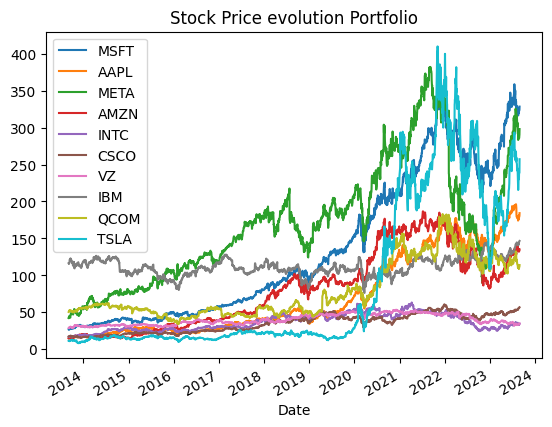

In [23]:
#plotting close prices of portfolio
cl_price.plot(title = "Stock Price evolution Portfolio") 

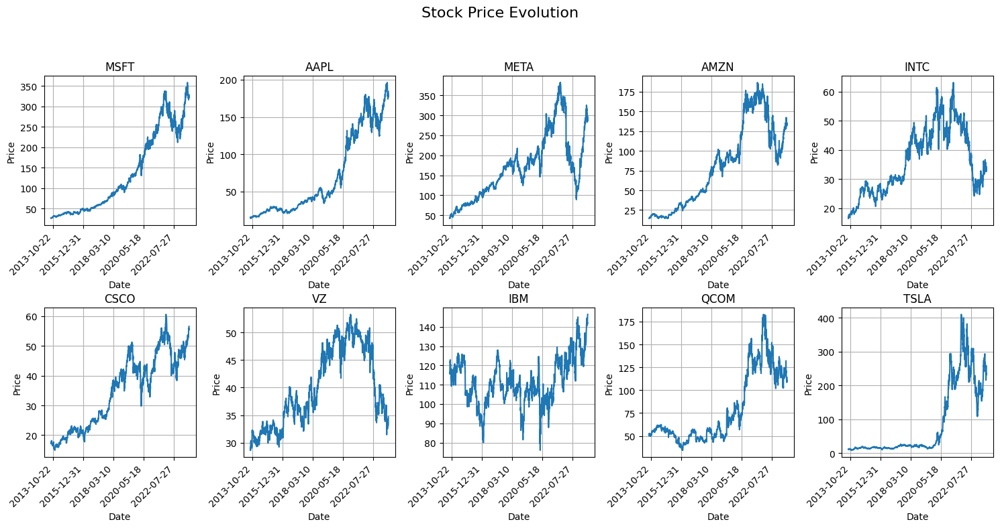

In [24]:
# Plotting Subplots of individual stocks

# Create subplots with a 2x5 layout (2 rows, 5 columns)
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 8))  # Adjust figsize as needed
fig.suptitle("Stock Price Evolution", fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate over the columns of cl_price and plot each stock's price evolution
for i, column in enumerate(cl_price.columns):
    if i >= len(axes):
        break  # Break the loop after populating all available subplots

    ax = axes[i]
    cl_price[column].plot(ax=ax, title=column, grid=True)
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    ax.tick_params(axis='x', rotation=45)
    ax.xaxis.set_major_locator(plt.MaxNLocator(6))  # Limit number of x-axis ticks for readability

# Adjust layout and spacing
plt.tight_layout()
plt.subplots_adjust(top=0.85)  # Adjust top spacing to make room for the title

# Show the plot
plt.show()

<Axes: title={'center': 'Daily Return Evolution Portfolio'}, xlabel='Date'>

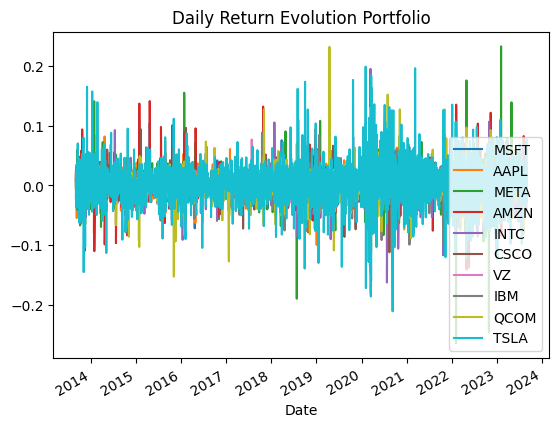

In [25]:
#plotting daily returns of portfolio
daily_return.plot(title = "Daily Return Evolution Portfolio")

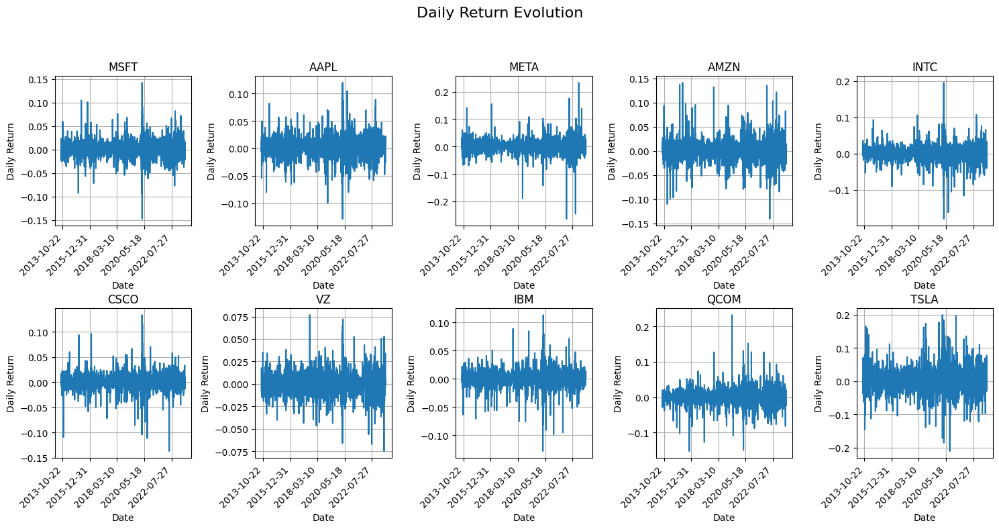

In [26]:
# Plotting daily returns of individual stocks

# Create subplots with a 2x5 layout (2 rows, 5 columns)
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 8))  # Adjust figsize as needed
fig.suptitle("Daily Return Evolution", fontsize=16)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate over the columns of daily_return and plot each stock's daily return evolution
for i, column in enumerate(daily_return.columns):
    if i >= len(axes):
        break  # Break the loop after populating all available subplots

    ax = axes[i]
    daily_return[column].plot(ax=ax, title=column, grid=True)
    ax.set_xlabel("Date")
    ax.set_ylabel("Daily Return")
    ax.tick_params(axis='x', rotation=45)
    ax.xaxis.set_major_locator(plt.MaxNLocator(6))  # Limit number of x-axis ticks for readability

# Adjust layout and spacing
plt.tight_layout()
plt.subplots_adjust(top=0.85)  # Adjust top spacing to make room for the title

# Show the plot
plt.show()

<Axes: title={'center': 'Cumulative Return Portfolio'}, xlabel='Date'>

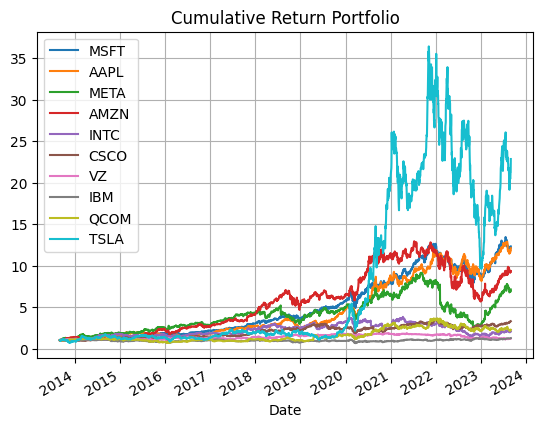

In [27]:
# Cumulative product of returns is important
(1+daily_return).cumprod().plot(title = "Cumulative Return Portfolio", grid = True)    

<BarContainer object of 10 artists>

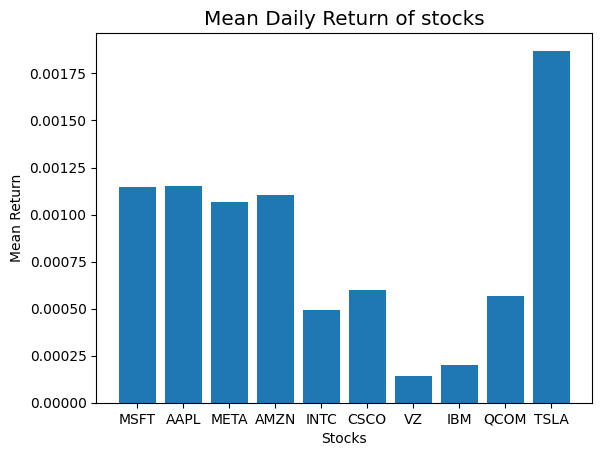

In [28]:
fig, ax = plt.subplots()

# Plotting using ggplot theme
plt.style.use("ggplot")

# Use the set function within axis object
ax.set(title = "Mean Daily Return of stocks", xlabel = "Stocks", ylabel = "Mean Return")

# Bar chart for mean daily return
plt.bar(x = daily_return.columns, height = daily_return.mean())

<BarContainer object of 10 artists>

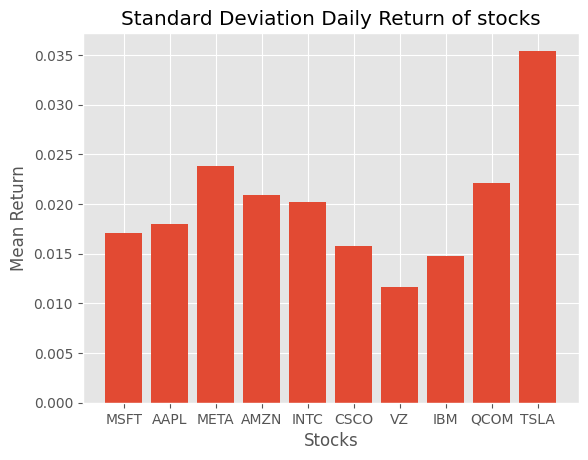

In [31]:
fig, ax = plt.subplots()

# Plotting using ggplot theme
plt.style.use("ggplot")

# Use the set function within axis object
ax.set(title = "Standard Deviation Daily Return of stocks", xlabel = "Stocks", ylabel = "Mean Return")

# Bar chart for mean daily return
plt.bar(x = daily_return.columns, height = daily_return.std())

In [30]:
# Download historical data for required stocks
tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]
ohlcv_data = {}

# looping over tickers and storing OHLCV dataframe in dictionary
for ticker in tickers:
    temp = yf.download(ticker,period='1mo',interval='5m') # Interval of 5 minutes for 1 month
    temp.dropna(how="any",inplace=True)
    ohlcv_data[ticker] = temp

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


# Implementing Technical Indicators

## Side note: Using TA-Lib

TA-lib library has a wide range of technical indicators that we can use easily. This is shown below for demonstration purposes.

In [32]:
# Download historical data for required stocks
tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]
ohlcv_data = {}

# looping over tickers and storing OHLCV dataframe in dictionary
for ticker in tickers:
    temp = yf.download(ticker,period='1mo',interval='5m')
    temp.dropna(how="any",inplace=True)
    ohlcv_data[ticker] = temp

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [33]:
ohlc_dict = copy.deepcopy(ohlcv_data) #create a copy of extracted data

# Apply talib functions on each dataframe
for ticker in tickers:
    # Calculate momentum indicators (e.g. MACD, ADX, RSI etc.) using talib
    ohlc_dict[ticker]["ADX"] = talib.ADX(ohlc_dict[ticker]["High"],
                                        ohlc_dict[ticker]["Low"],
                                        ohlc_dict[ticker]["Adj Close"],
                                        timeperiod=14)
    # Identify chart patterns (e.g. two crows, three crows, three inside, engulging pattern etc.)
    ohlc_dict[ticker]["3I"] = talib.CDL3WHITESOLDIERS(ohlc_dict[ticker]["Open"],
                                                 ohlc_dict[ticker]["High"],
                                                 ohlc_dict[ticker]["Low"],
                                                 ohlc_dict[ticker]["Adj Close"])
    
    # Statistical functions (e.g. beta, correlation etc.)
    ohlc_dict[ticker]["Beta"] = talib.BETA(ohlc_dict[ticker]["High"],
                                         ohlc_dict[ticker]["Low"],
                                         timeperiod=14)

However, we lose control over the exact implementation and the lack of documentation makes it hard to understand the output.

Hence, we have implemented various technical indicators in Python below and have not used the TA-lib library.

## MACD Implementation in Python

**Trading View Calculation of MACD:**

https://www.tradingview.com/scripts/macd/?solution=43000502344

MACD Line: (12-day EMA - 26-day EMA) 

Signal Line: 9-day EMA of MACD Line

MACD Histogram: MACD Line - Signal Line

**Trading View Calculation of EMA:**
    
https://www.tradingview.com/scripts/ema/?solution=43000502589
    
1. Calculate the SMA

(Period Values / Number of Periods)

2. Calculate the Multiplier

(2 / (Number of Periods + 1) therefore (2 / (5+1) = 33.333%

3. Calculate the EMA
For the first EMA, we use the SMA(previous day) instead of EMA(previous day).

EMA = {Close - EMA(previous day)} x multiplier + EMA(previous day)

In [34]:
def MACD(DF, a=12 ,b=26, c=9):
    """function to calculate MACD
       typical values a(fast moving average) = 12; 
                      b(slow moving average) =26; 
                      c(signal line ma window) =9"""
    
    # Making a copy of the dataframe to preserve orignal data
    df = DF.copy()
    
    # Calculating fast (shorter) exponential moving average
    # Need to add min_periods for the minimum number of periods to calculate moving average
    df["ma_fast"] = df["Adj Close"].ewm(span=a, min_periods=a).mean()
    
    # Calculating slow (longer) exponential moving average
    df["ma_slow"] = df["Adj Close"].ewm(span=b, min_periods=b).mean()
    
    # Calculating macd line
    df["macd"] = df["ma_fast"] - df["ma_slow"]
    
    # Calculating signal line
    df["signal"] = df["macd"].ewm(span=c, min_periods=c).mean()
    
    # Return all rows but only macd and signal column
    return df.loc[:,["macd","signal"]]

for ticker in ohlcv_data:
    ohlcv_data[ticker][["MACD","SIGNAL"]] = MACD(ohlcv_data[ticker], a=12 ,b=26, c=9)

In [35]:
# Dropping rows with NaN values
ohlcv_NaN_data = ohlcv_data

for ticker in tickers:
    ohlcv_NaN_data[ticker].dropna(inplace=True)

# Inspecting Microsoft Dataframe
ohlcv_NaN_data["MSFT"]

,Open,High,Low,Close,Adj Close,Volume,MACD,SIGNAL
Datetime,,,,,,,,
2023-07-31 12:15:00-04:00,334.51998901,334.82000732,334.32998657,334.76501465,334.76501465,130743,-0.12939246,-0.16489353
2023-07-31 12:20:00-04:00,334.78500366,334.78988647,334.32998657,334.48181152,334.48181152,129171,-0.12665924,-0.15632683
2023-07-31 12:25:00-04:00,334.48001099,334.83499146,334.42001343,334.69000244,334.69000244,108695,-0.10740688,-0.14562342
2023-07-31 12:30:00-04:00,334.67001343,334.76998901,334.32000732,334.35998535,334.35998535,155941,-0.11603546,-0.13926917
2023-07-31 12:35:00-04:00,334.36999512,334.49969482,334.10000610,334.35501099,334.35501099,171200,-0.12183077,-0.13557860
2023-07-31 12:40:00-04:00,334.34500122,334.34500122,334.14001465,334.33499146,334.33499146,110203,-0.12649086,-0.13367744
2023-07-31 12:45:00-04:00,334.33499146,334.58999634,334.20001221,334.58999634,334.58999634,127401,-0.10920632,-0.12860473
2023-07-31 12:50:00-04:00,334.60000610,334.75000000,334.39999390,334.64999390,334.64999390,140690,-0.08982519,-0.12062419
2023-07-31 12:55:00-04:00,334.64001465,334.67498779,334.26501465,334.51998901,334.51998901,143149,-0.08361544,-0.11305193


## ATR Implementation in Python

ATR calculation in Trading View:

https://www.tradingview.com/scripts/averagetruerange/?solution=43000501823

To calculate the ATR, the True Range first needs to be discovered. True Range takes into account the most current period high/low range as well as the previous period close if necessary.

The True Range is the largest of the following:

The Current Period High minus (-) Current Period Low
The Absolute Value (abs) of the Current Period High minus (-) The Previous Period Close
The Absolute Value (abs) of the Current Period Low minus (-) The Previous Period Close

true range = max[(high - low), abs(high - previous close), abs (low - previous close)]

the ATR is a Relative Moving Average (RMA) of the True Range, but the smoothing type can be changed to SMA, EMA or WMA in the settings.

In [38]:
def ATR(DF, n=14):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    
    # Subtracting present row of High by Low
    df["H-L"] = df["High"] - df["Low"]
    
    #Take present row of High and subtract it by previous row of Adjusted Close
    df["H-PC"] = abs(df["High"] - df["Adj Close"].shift(1)) 
    
    #Take present row of Low and subtract it by previous row of Adjusted Close
    df["L-PC"] = abs(df["Low"] - df["Adj Close"].shift(1))
    
    # Taking the maximum of these three values
    # To calculate max values along the rows, we use axis = 1
    # Use skipna = False, such that if any row has NaN value, the max value becomes NaN value
    df["TR"] = df[["H-L","H-PC","L-PC"]].max(axis=1, skipna=False)
    
    df["ATR"] = df["TR"].ewm(span = n, min_periods = n).mean()
    #df["ATR"] = df["TR"].ewm(com=n, min_periods=n).mean()
    
    return df["ATR"]

In [39]:
for ticker in ohlcv_data:
    # Applying ATR on all tickers
    ohlcv_data[ticker]["ATR"] = ATR(ohlcv_data[ticker])
    # Dropping rows with NaN values
    ohlcv_data[ticker].dropna(inplace=True)

# Inspecting Microsoft Dataframe
ohlcv_data["MSFT"]

,Open,High,Low,Close,Adj Close,Volume,MACD,SIGNAL,ATR
Datetime,,,,,,,,,
2023-07-31 13:25:00-04:00,334.17001343,334.35000610,334.02999878,334.10000610,334.10000610,156155,-0.13381148,-0.10841803,0.40472349
2023-07-31 13:30:00-04:00,334.07998657,334.21499634,333.98999023,334.14999390,334.14999390,181951,-0.13900020,-0.11456349,0.37758945
2023-07-31 13:35:00-04:00,334.15499878,334.67001343,334.11691284,334.64080811,334.64080811,197736,-0.10309594,-0.11226128,0.40362887
2023-07-31 13:40:00-04:00,334.64001465,334.64001465,334.29998779,334.42999268,334.42999268,178848,-0.09030507,-0.10785673,0.39444837
2023-07-31 13:45:00-04:00,334.42999268,334.47000122,334.11999512,334.32000732,334.32000732,168500,-0.08787944,-0.10385158,0.38803470
2023-07-31 13:50:00-04:00,334.32000732,334.45001221,334.11999512,334.27999878,334.27999878,128276,-0.08811690,-0.10069855,0.37975287
2023-07-31 13:55:00-04:00,334.23999023,334.42001343,334.20999146,334.33520508,334.33520508,114539,-0.08295652,-0.09714464,0.35575025
2023-07-31 14:00:00-04:00,334.34811401,334.40170288,334.13000488,334.17001343,334.17001343,137116,-0.09096701,-0.09590759,0.34395924
2023-07-31 14:05:00-04:00,334.14999390,334.35501099,333.95001221,334.32000732,334.32000732,201476,-0.08438710,-0.09360120,0.35246289


## Bollinger Bands Implementation in Python

Trading view calculation of Bollinger Bands:

https://www.tradingview.com/scripts/bollingerbands/?solution=43000501840

Middle Band – 20 Day Simple Moving Average

Upper Band – 20 Day Simple Moving Average + (Standard Deviation x 2)

Lower Band – 20 Day Simple Moving Average - (Standard Deviation x 2)

In [40]:
def Boll_Band(DF, n=20):
    "function to calculate Bollinger Band"
    
    # Copy the dataframe to preserve orignal values
    df = DF.copy()
    
    # Calculating the middle band, which is a simple moving average of the closing prices
    df["MB"] = df["Adj Close"].rolling(n).mean()
    
    # ddof is degree of freedom. By default, the degree of freedom is 1, but we need 0. 
    # We need to calculate standard deviation of population and not sample and denominator has to be n and not n-1. 
    # hence use ddof = 0
    
    # Calculating the upper band
    df["UB"] = df["MB"] + 2*df["Adj Close"].rolling(n).std(ddof=0)
    
    # Calculating the lower band
    df["LB"] = df["MB"] - 2*df["Adj Close"].rolling(n).std(ddof=0)
    
    # Calculating band width, difference between upper band and lower band
    df["BB_Width"] = df["UB"] - df["LB"]
    
    return df[["MB","UB","LB","BB_Width"]]

In [41]:
for ticker in ohlcv_data:
    # Applying Bollinger Band on all tickers
    ohlcv_data[ticker][["MB","UB","LB","BB_Width"]] = Boll_Band(ohlcv_data[ticker])
    # Dropping rows with NaN values
    ohlcv_data[ticker].dropna(inplace=True)

# Inspecting Amazon Dataframe
ohlcv_data["AMZN"]

,Open,High,Low,Close,Adj Close,Volume,MACD,SIGNAL,ATR,MB,UB,LB,BB_Width
Datetime,,,,,,,,,,,,,
2023-07-31 15:00:00-04:00,133.42999268,133.44999695,133.22000122,133.27499390,133.27499390,283693,-0.00424245,-0.00661423,0.18332679,133.31891022,133.49047112,133.14734931,0.34312181
2023-07-31 15:05:00-04:00,133.28999329,133.30000305,133.16000366,133.17439270,133.17439270,246394,-0.01489712,-0.00827092,0.17750493,133.31437988,133.49589252,133.13286725,0.36302527
2023-07-31 15:10:00-04:00,133.17999268,133.27999878,133.11999512,133.25500488,133.25500488,256940,-0.01667331,-0.00995149,0.17515573,133.30638046,133.48350003,133.12926090,0.35423913
2023-07-31 15:15:00-04:00,133.25500488,133.38000488,133.22000122,133.31539917,133.31539917,561234,-0.01307740,-0.01057670,0.17312369,133.29790039,133.45512294,133.14067784,0.31444509
2023-07-31 15:20:00-04:00,133.30499268,133.36999512,133.21000671,133.23989868,133.23989868,272364,-0.01611023,-0.01168344,0.17136349,133.28514557,133.41542128,133.15486986,0.26055142
2023-07-31 15:25:00-04:00,133.24000549,133.37500000,133.21000671,133.32000732,133.32000732,332812,-0.01193542,-0.01173384,0.17051042,133.28598557,133.41693121,133.15503992,0.26189128
2023-07-31 15:30:00-04:00,133.31919861,133.46949768,133.31919861,133.39500427,133.39500427,465448,-0.00256615,-0.00990026,0.16780538,133.29723587,133.42501257,133.16945918,0.25555339
2023-07-31 15:35:00-04:00,133.38999939,133.42999268,133.32000732,133.33000183,133.33000183,507224,-0.00036577,-0.00799333,0.16007077,133.30023575,133.42813139,133.17234010,0.25579129
2023-07-31 15:40:00-04:00,133.33500671,133.49000549,133.31500244,133.36090088,133.36090088,455304,0.00382002,-0.00563063,0.16206740,133.30253067,133.43302462,133.17203672,0.26098789


## RSI Implementation in Python

Tradingview RSI implementation:

https://www.tradingview.com/scripts/relativestrengthindex/?solution=43000502338

Here's the longform pinescript (TradingView's programming language):

change = change(close) # This is calculating the change in closing price between current period and last period

gain = change >= 0 ? change : 0.0    # If change is positive number, then gain is that change else 0.

loss = change < 0 ? (-1) * change : 0.0  # If change is negative number, then loss is that change else 0.

avgGain = rma(gain, 14)  # Calculate average gain by applying RMA function on gain

avgLoss = rma(loss, 14)  # Calculate average gain by applying RMA function on gain

rs = avgGain / avgLoss   # Calculate relative strength by dividing average gain by average loss

rsi = 100 - (100 / (1 + rs)) # Calculate RSI

In [ ]:
def RSI(DF, n=14):
    "function to calculate RSI"
    
    # Copy the dataframe to preserve orignal data
    df = DF.copy()
    
    # Calculate change between current period and previous period
    df["change"] = df["Adj Close"] - df["Adj Close"].shift(1)
    
    # Finding gain: Implementing an if, else function using np.where
    df["gain"] = np.where(df["change"]>=0, df["change"], 0)
    
    # Finding loss: Implementing an if, else function using np.where
    df["loss"] = np.where(df["change"]<0, -1*df["change"], 0)
    
    # Calculating avgGain.
    # Using our defined alpha function to match trading view.
    # Don't calculate values and set to NaN if minimum periods condition is not reached.
    df["avgGain"] = df["gain"].ewm(alpha=1/n, min_periods=n).mean()
    
    # Calculating avgLoss
    # Using our defined alpha function to match trading view. Using minimum periods to remove NaN values.
    # Don't calculate values and set to NaN if minimum periods condition is not reached.
    df["avgLoss"] = df["loss"].ewm(alpha=1/n, min_periods=n).mean()
    
    # Calculating relative strength
    df["rs"] = df["avgGain"]/df["avgLoss"]
    
    # Calculating relative strength index
    df["rsi"] = 100 - (100 / (1 + df["rs"]))
    
    return df["rsi"]

In [ ]:
for ticker in ohlcv_data:
    # Applying Bollinger Band on all tickers
    ohlcv_data[ticker]["RSI"] = RSI(ohlcv_data[ticker])
    # Dropping rows with NaN values
    ohlcv_data[ticker].dropna(inplace=True)

# Inspecting Amazon Dataframe
ohlcv_data["AMZN"]

## ADX Implementation in Python

Trading view ADX Implementation:

https://www.tradingview.com/ideas/directionalmovement/?solution=43000502250

Calculating the DMI can actually be broken down into two parts. First, calculating the +DI and -DI, and second, calculating the ADX. To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). +DM and -DM are calculated using the High, Low and Close for each period. You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [47]:
def ATR(DF, n=14):
    "function to calculate True Range and Average True Range"
    
    # Copy the dataframe to preserve orignal data
    df = DF.copy()
    
    # Calculating High - Low value of current row
    df["H-L"] = df["High"] - df["Low"]
    
    # Calculating High value of current row - Adjusted Close of previous row
    df["H-PC"] = abs(df["High"] - df["Adj Close"].shift(1))
    
    # Calculating Low value of current row - Adjusted Close of previous row
    df["L-PC"] = abs(df["Low"] - df["Adj Close"].shift(1))
    
    # Taking the max of the previous 3 values and adding to True Range
    df["TR"] = df[["H-L","H-PC","L-PC"]].max(axis=1, skipna=False)
    
    # Calculates Average True Range
    df["ATR"] = df["TR"].ewm(com=n, min_periods=n).mean()
    return df["ATR"]

def ADX(DF, n=20):
    "function to calculate ADX"
    
    # Copy the dataframe to preserve orignal data
    df = DF.copy()
    
    # Apply ATR function
    df["ATR"] = ATR(DF, n)
    
    # Calculate Upmove: High of current row - High of previous row
    df["upmove"] = df["High"] - df["High"].shift(1)
    
    # Calculate Downmove: Low of previous row - Low of current row
    df["downmove"] = df["Low"].shift(1) - df["Low"]
    
    # Defining positive and negative directional movement according to condition
    df["+dm"] = np.where((df["upmove"]>df["downmove"]) & (df["upmove"] >0), df["upmove"], 0)
    df["-dm"] = np.where((df["downmove"]>df["upmove"]) & (df["downmove"] >0), df["downmove"], 0)
    
    # Calculating positive and negative directional indicator according to formula
    df["+di"] = 100 * (df["+dm"]/df["ATR"]).ewm(alpha=1/n, min_periods=n).mean()
    df["-di"] = 100 * (df["-dm"]/df["ATR"]).ewm(alpha=1/n, min_periods=n).mean()
    
    # Calculating ADX value
    df["ADX"] = 100* abs((df["+di"] - df["-di"])/(df["+di"] + df["-di"])).ewm(alpha=1/n, min_periods=n).mean()
    
    return df["ADX"]

In [48]:
for ticker in ohlcv_data:
    # Applying Bollinger Band on all tickers
    ohlcv_data[ticker]["ADX"] = ADX(ohlcv_data[ticker])
    # Dropping rows with NaN values
    ohlcv_data[ticker].dropna(inplace=True)

# Inspecting Amazon Dataframe
ohlcv_data["AMZN"]

,Open,High,Low,Close,Adj Close,Volume,MACD,SIGNAL,ATR,MB,UB,LB,BB_Width,ADX
Datetime,,,,,,,,,,,,,,
2023-08-01 13:20:00-04:00,132.41499329,132.44999695,132.28999329,132.38499451,132.38499451,211477,-0.02075425,-0.03792898,0.16105566,132.43240967,132.74112163,132.12369771,0.61742392,11.27604770
2023-08-01 13:25:00-04:00,132.38980103,132.38989258,132.19000244,132.21000671,132.21000671,268132,-0.03621102,-0.03758539,0.16623360,132.41990967,132.74304798,132.09677135,0.64627663,11.49415757
2023-08-01 13:30:00-04:00,132.20500183,132.22000122,132.02830505,132.06990051,132.06990051,421367,-0.05908433,-0.04188517,0.16962862,132.39148483,132.73227862,132.05069105,0.68158757,12.44480559
2023-08-01 13:35:00-04:00,132.05999756,132.08670044,131.88000488,131.96009827,131.96009827,432494,-0.08509039,-0.05052622,0.17457088,132.35798950,132.72879021,131.98718879,0.74160142,13.86734784
2023-08-01 13:40:00-04:00,131.97000122,132.05000305,131.91979980,132.01010132,132.01010132,257982,-0.10050713,-0.06052240,0.16865519,132.32974472,132.71586502,131.94362442,0.77224060,15.15855241
2023-08-01 13:45:00-04:00,132.01499939,132.02000427,131.90499878,131.98249817,131.98249817,257963,-0.11364225,-0.07114637,0.16150189,132.29886932,132.69229469,131.90544396,0.78685073,16.38947071
2023-08-01 13:50:00-04:00,131.96499634,132.11000061,131.94999695,132.05999756,132.05999756,234915,-0.11645617,-0.08020833,0.16130213,132.27011948,132.64467684,131.89556211,0.74911473,16.87624490
2023-08-01 13:55:00-04:00,132.05650330,132.16000366,132.05000305,132.08999634,132.08999634,228667,-0.11494068,-0.08715480,0.15446192,132.25161896,132.62337369,131.87986423,0.74350946,16.98790544
2023-08-01 14:00:00-04:00,132.10000610,132.13999939,132.00999451,132.08500671,132.08500671,319859,-0.11284148,-0.09229214,0.15120098,132.23836899,132.61402209,131.86271589,0.75130620,17.26973501


## Renko Implementation in Python

In [49]:
# Using library to calculate Renko
from stocktrends import Renko

tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]

# Create 5 minute data
ohlcv_data = {}

# Create hourly data
hour_data = {}

# Store renko data
renko_data = {}

for ticker in tickers:
    temp = yf.download(ticker,period='1mo',interval='5m') # Interval of 5 minutes for 1 month
    temp.dropna(how="any",inplace=True) # Drop NA values
    ohlcv_data[ticker] = temp
    
    temp = yf.download(ticker,period='1y',interval='1h') # Interval of 1 hour for 1 year
    temp.dropna(how="any",inplace=True) # Drop NA values
    hour_data[ticker] = temp

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [50]:
def ATR(DF, n=14):
    "function to calculate True Range and Average True Range"
    
    # Copy the dataframe to preserve orignal data
    df = DF.copy()
    
    # Calculating High - Low value of current row
    df["H-L"] = df["High"] - df["Low"]
    
    # Calculating High value of current row - Adjusted Close of previous row
    df["H-PC"] = abs(df["High"] - df["Adj Close"].shift(1))
    
    # Calculating Low value of current row - Adjusted Close of previous row
    df["L-PC"] = abs(df["Low"] - df["Adj Close"].shift(1))
    
    # Taking the max of the previous 3 values and adding to True Range
    df["TR"] = df[["H-L","H-PC","L-PC"]].max(axis=1, skipna=False)
    
    # Calculates Average True Range
    df["ATR"] = df["TR"].ewm(com=n, min_periods=n).mean()
    return df["ATR"]

In [51]:
def renko_DF(DF, hourly_df):
    "function to convert ohlc data into renko bricks"
    
    # Creating copy to preserve values
    df = DF.copy()
    
    # Resetting index to 0,1,2 .. and bringing date as column
    df.reset_index(inplace=True)
    
    # Dropping close column, as we will use adjusted close
    df.drop("Close",axis=1,inplace=True)
    
    # Change all the column names to make it suitable for the stocktrends library
    df.columns = ["date","open","high","low","close","volume"]
    
    # Creating an object df2 of Renko class
    df2 = Renko(df)
    
    # Using brick_size function - 3 * ATR of Hourly data 
    df2.brick_size = 3*round(ATR(hourly_df,120).iloc[-1],1)
    
    # Obtain transformed Renko data
    renko_df = df2.get_ohlc_data() 
    
    # Return dataframe
    return renko_df

In [52]:
for ticker in ohlcv_data:
    renko_data[ticker] = renko_DF(ohlcv_data[ticker],hour_data[ticker])
    
renko_data["AMZN"]

,date,open,high,low,close,uptrend
0,2023-07-31 09:30:00-04:00,128.70000000,132.00000000,128.70000000,132.00000000,True
1,2023-08-04 09:30:00-04:00,132.00000000,135.30000000,132.00000000,135.30000000,True
2,2023-08-04 09:30:00-04:00,135.30000000,138.60000000,135.30000000,138.60000000,True
3,2023-08-04 10:35:00-04:00,138.60000000,141.90000000,138.60000000,141.90000000,True
4,2023-08-16 15:45:00-04:00,138.60000000,138.60000000,135.30000000,135.30000000,False
5,2023-08-18 09:30:00-04:00,135.30000000,135.30000000,132.00000000,132.00000000,False


## CAGR Implementation in Python

In [53]:
# Import necesary libraries
import yfinance as yf

# Download historical data for required stocks
tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]
ohlcv_data = {}

# looping over tickers and storing OHLCV dataframe in dictionary
for ticker in tickers:
    # Daily dataframe for 7 months
    temp = yf.download(ticker,period='7mo',interval='1d') # 1 day data over interval of 7 months
    temp.dropna(how="any",inplace=True)
    ohlcv_data[ticker] = temp

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [54]:
def CAGR(DF):
    "function to calculate the Cumulative Annual Growth Rate of a trading strategy"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculating daily % change in closing price
    df["return"] = DF["Adj Close"].pct_change()
    
    # Calculating cumulative return
    df["cum_return"] = (1 + df["return"]).cumprod()
    
    # Approximation method: Take length of dataframe which is number of trading days
    # and divide it by total number of tradig days in a year, 252 days.
    n = len(df)/252

    # Obtain last value of cumulative return
    CAGR = (df["cum_return"][-1])**(1/n) - 1
    
    return CAGR


In [55]:
for ticker in ohlcv_data:
    print("CAGR of {} = {}".format(ticker,CAGR(ohlcv_data[ticker])))

CAGR of MSFT = 0.6990169149128265
CAGR of AAPL = 0.5535959522690177
CAGR of META = 2.3557039329568252
CAGR of AMZN = 0.6551953437328322
CAGR of INTC = 0.4701823736574058
CAGR of CSCO = 0.3488552353400134
CAGR of VZ = -0.2054870722339388
CAGR of IBM = 0.22080973544439275
CAGR of QCOM = -0.2034906170669668
CAGR of TSLA = 1.1036881409127122


## Volatility Implementation in Python

In [56]:
def volatility(DF):
    "function to calculate annualized volatility of a trading strategy"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculating daily % change in closing price
    df["daily_ret"] = DF["Adj Close"].pct_change()
    
    # Calculating volatility, the standard deviation of returns. This is annualized.
    vol = df["daily_ret"].std() * np.sqrt(252)
    
    return vol

In [57]:
for ticker in ohlcv_data:
    print("vol for {} = {}".format(ticker,volatility(ohlcv_data[ticker])))

vol for MSFT = 0.2670818592361143
vol for AAPL = 0.20638181973426473
vol for META = 0.4659618146952736
vol for AMZN = 0.3405176436521879
vol for INTC = 0.3965704161448396
vol for CSCO = 0.19381849272722
vol for VZ = 0.22537086757676603
vol for IBM = 0.1481557183819122
vol for QCOM = 0.31827463898628117
vol for TSLA = 0.5124931123512338


## Sharpe & Sortino Ratio Implementation in Python

In [58]:
def sharpe(DF, rf):
    "function to calculate Sharpe Ratio of a trading strategy"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calcualting Sharpe ratio
    sharpe_ratio = (CAGR(df) - rf)/volatility(df)
    return sharpe_ratio
 
def sortino(DF, rf):
    "function to calculate Sortino Ratio of a trading strategy"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculating daily % return
    df["return"] = df["Adj Close"].pct_change()
    
    # Returning only negative return
    neg_return = np.where(df["return"]>0,0,df["return"])
    
    # Method 1: Calculating negative volatility using downward deviation approach
    neg_vol = np.sqrt((pd.Series(neg_return[neg_return != 0]) ** 2).mean() * 252)
    
    # Method 2: Calculating negative volatility using standard deviation
    # Converting NumPy arrays to Panda series to use std(), which automatically removes NaN values
    #neg_vol = pd.Series(neg_return[neg_return != 0]).std() * np.sqrt(252)
    
    sortino_ratio = (CAGR(df) - rf)/neg_vol
    
    return sortino_ratio

In [59]:
for ticker in ohlcv_data:
    print("Sharpe of {} = {}".format(ticker,sharpe(ohlcv_data[ticker],0.0420))) # Using riskfree rate of 4.20%, close to what US government 30 year bond is yielding as of now. 
    print("Sortino of {} = {}".format(ticker,sortino(ohlcv_data[ticker],0.03))) 
    print()

Sharpe of MSFT = 2.4599833054628735
Sortino of MSFT = 3.072592325847759

Sharpe of AAPL = 2.4788809059235146
Sortino of AAPL = 2.8200678070640652

Sharpe of META = 4.96543678041499
Sortino of META = 8.654472826204898

Sharpe of AMZN = 1.800774071957232
Sortino of AMZN = 1.9683507007014736

Sharpe of INTC = 1.0797133528513647
Sortino of INTC = 1.1522168139541498

Sharpe of CSCO = 1.5832092749368414
Sortino of CSCO = 1.5906267475866385

Sharpe of VZ = -1.098132491102203
Sortino of VZ = -0.9093639880763801

Sharpe of IBM = 1.2069040425659534
Sortino of IBM = 1.3236364199083022

Sharpe of QCOM = -0.7713169288287164
Sortino of QCOM = -0.7379750368325425

Sharpe of TSLA = 2.071614457493608
Sortino of TSLA = 2.1152152885136357



## Maximum Drawdown & Calmar Ratio implementation in Python

Calmar ratio attemps to find your compounded annual return adjusted for your maximum drawdown

In [60]:
def max_dd(DF):
    "function to calculate max drawdown"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculating daily % return
    df["return"] = df["Adj Close"].pct_change()
    
    # Calculating cumulative return
    df["cum_return"] = (1+df["return"]).cumprod()
    
    # Keep track of maximum value it encounters for cumulative return using .cummax() function
    df["cum_roll_max"] = df["cum_return"].cummax()
    
    # Calculating drawdown for each point
    df["drawdown"] = df["cum_roll_max"] - df["cum_return"]
    
    # Calculating maximum drawdown
    max_drawdown = (df["drawdown"]/df["cum_roll_max"]).max()
    
    # Obtain maximum drawdown
    return max_drawdown


In [61]:
def calmar(DF):
    "function to calculate calmar ratio"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculating calmar ratio 
    calmar_ratio = CAGR(df)/max_dd(df)
    
    return calmar_ratio

for ticker in ohlcv_data:
    print("max drawdown of {} = {}".format(ticker,max_dd(ohlcv_data[ticker])))
    print("calmar ratio of {} = {}".format(ticker,calmar(ohlcv_data[ticker])))
    print()

max drawdown of MSFT = 0.11777772295421135
calmar ratio of MSFT = 5.935052040228223

max drawdown of AAPL = 0.1130823737855527
calmar ratio of AAPL = 4.8955105356989295

max drawdown of META = 0.12974686481776612
calmar ratio of META = 18.15615303125429

max drawdown of AMZN = 0.1964396385244202
calmar ratio of AMZN = 3.3353520127323093

max drawdown of INTC = 0.1688155296959559
calmar ratio of INTC = 2.7851843636910933

max drawdown of CSCO = 0.1197997436201904
calmar ratio of CSCO = 2.9119864934437074

max drawdown of VZ = 0.22177488415632104
calmar ratio of VZ = -0.9265570040343182

max drawdown of IBM = 0.10776453392612556
calmar ratio of IBM = 2.0490019062835794

max drawdown of QCOM = 0.25141353133806454
calmar ratio of QCOM = -0.8093860978124605

max drawdown of TSLA = 0.2823469190729377
calmar ratio of TSLA = 3.908978870874806



# Trading Strategy - Portfolio Rebalancing

Note: We will redefine the various indicators that we have coded and change certain variables to make it specific to the strategy we are deploying.

This can be made more modular by passing those as inputs to the function, which shall be refined in another iteration.

**About this strategy:**

Here, we choose a portfolio of stocks based on the stock universe.

We build a long-only portfolio with fixed individual position sizes of m number of stocks.

Our main criteria is picking m number of stocks based on monthly returns.

We rebalance our portfolio every month by removing the worse x stocks and replace them with top x stocks from stock universe.

Note: We can select existing stocks to replace worse performing stocks should they have high returns.

Then, we backtest the strategy and compare the key metrics with a buy and hold strategy.

In [63]:
def CAGR(DF):
    "function to calculate the Cumulative Annual Growth Rate of a trading strategy"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculating cumulative monthly return
    df["cum_return"] = (1 + df["mon_ret"]).cumprod()
    
    # Take length of dataframe and divide it by 12, number of months in a year
    n = len(df)/12
    
    # Obtain last value of cumulative return
    CAGR = (df["cum_return"].tolist()[-1])**(1/n) - 1
    
    return CAGR

def volatility(DF):
    "function to calculate annualized volatility of a trading strategy"
    
    # Making a copy to preserve orignal data
    df = DF.copy()
    
    # Calculate standard deviation and annualize it to a year by multiplying with 12
    vol = df["mon_ret"].std() * np.sqrt(12)
    
    return vol

def sharpe(DF,rf):
    "function to calculate sharpe ratio ; rf is the risk free rate"
    df = DF.copy()
    sr = (CAGR(df) - rf)/volatility(df)
    return sr
    
def max_dd(DF):
    "function to calculate max drawdown"
    df = DF.copy()
    df["cum_return"] = (1 + df["mon_ret"]).cumprod()
    df["cum_roll_max"] = df["cum_return"].cummax()
    df["drawdown"] = df["cum_roll_max"] - df["cum_return"]
    df["drawdown_pct"] = df["drawdown"]/df["cum_roll_max"]
    max_dd = df["drawdown_pct"].max()
    return max_dd

In [64]:
# Download historical data (monthly) for DJI constituent stocks in 2013 (to eliminate survivorship bias)

# Note: Had to delete DOW Chemicals because Yahoo Finance does not have all the data for that
tickers = ["MMM","AXP","T","BA","CAT","CSCO","KO", "XOM","GE","GS","HD",
           "IBM","INTC","JNJ","JPM","MCD","MRK","MSFT","NKE","PFE","PG","TRV",
           "UNH","VZ","V","WMT","DIS"]

# directory with key as tickers and ohlc value for each stock
ohlc_mon = {}             
start = dt.datetime.today()-dt.timedelta(3650) # Obtaining data for past 10 years
end = dt.datetime.today()

# looping over tickers and creating a dataframe with close prices
for ticker in tickers:
    ohlc_mon[ticker] = yf.download(ticker,start,end,interval='1mo') # monthly data
    ohlc_mon[ticker].dropna(inplace=True,how="all")

# redefine tickers variable after removing any tickers with corrupted data
# tickers = ohlc_mon.keys() 

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [76]:
################################     Backtesting   ####################################

# calculating monthly return for each stock and consolidating return info by stock in a separate dataframe

# Use deepcopy to avoid any possibility that orignal data is being tampered with
ohlc_dict = copy.deepcopy(ohlc_mon)

# Create empty dataframe called return_df to store return values
return_df = pd.DataFrame()

for ticker in tickers:
    print("calculating monthly return for ",ticker)
    
    # Calculating monthly % return
    ohlc_dict[ticker]["mon_ret"] = ohlc_dict[ticker]["Adj Close"].pct_change()
    
    # Storing return values in return_df dataframe
    return_df[ticker] = ohlc_dict[ticker]["mon_ret"]

# drop any NA values in-place dataframe    
return_df.dropna(inplace=True)

# Defining portfolio of stocks
portfolio = ["MMM","AXP","T","BA","CAT","CSCO"]

# function to calculate portfolio return iteratively
def pflio(DF,m,x):
    """Returns cumulative portfolio return
    DF = dataframe with monthly return info for all stocks
    m = number of stock in the portfolio
    x = number of underperforming stocks to be removed from portfolio monthly"""
    df = DF.copy()
    
    # Create empty portfolio which is updated for every iteration
    portfolio = []
    
    # Empty list (initialized with 0 as first value will be 0 as there is no previous value)
    monthly_ret = [0]
    
    # Traverse every row of dataframe (every month)
    for i in range(len(df)):
        if len(portfolio) > 0:
            
            # Select all portfolio tickers for specific row and find mean (as they are equally weighted) to find monthly portfolio return
            monthly_ret.append(df[portfolio].iloc[i,:].mean())
            
            # Picking the worst (ascending = True) x stocks based on returns and save to list
            bad_stocks = df[portfolio].iloc[i,:].sort_values(ascending=True)[:x].index.values.tolist()
            
            # Remove all bad stocks in portfolio identified by bad_stocks function
            portfolio = [t for t in portfolio if t not in bad_stocks]
            
        # Calculate number of stocks to add to portfolio now
        fill = m - len(portfolio)
        
        # Choosing top (ascending = False) performing stocks to add in portfolio again from stock universe (tickers).
        # Here, you can add stocks that are already in your portfolio, if it is a top performing stock.
        new_picks = df.iloc[i,:].sort_values(ascending=False)[:fill].index.values.tolist()
        
        # Note (Second method): In case for the above command, you want to exclude the stocks already in your portfolio, use below command
        # new_picks = df[[t for t in tickers if t not in portfolio]].iloc[i,:].sort_values(ascending=False)[:fill].index.values.tolist()
        
        # Adding the new picks to portfolio
        portfolio = portfolio + new_picks
        
        # Check portfolio constituents
#         print(portfolio)
    
    # Convert monthly return to dataframe
    monthly_ret_df = pd.DataFrame(np.array(monthly_ret),columns=["mon_ret"])
    
    return monthly_ret_df

calculating monthly return for  MMM
calculating monthly return for  AXP
calculating monthly return for  T
calculating monthly return for  BA
calculating monthly return for  CAT
calculating monthly return for  CSCO
calculating monthly return for  KO
calculating monthly return for  XOM
calculating monthly return for  GE
calculating monthly return for  GS
calculating monthly return for  HD
calculating monthly return for  IBM
calculating monthly return for  INTC
calculating monthly return for  JNJ
calculating monthly return for  JPM
calculating monthly return for  MCD
calculating monthly return for  MRK
calculating monthly return for  MSFT
calculating monthly return for  NKE
calculating monthly return for  PFE
calculating monthly return for  PG
calculating monthly return for  TRV
calculating monthly return for  UNH
calculating monthly return for  VZ
calculating monthly return for  V
calculating monthly return for  WMT
calculating monthly return for  DIS


In [77]:
#calculating overall strategy's KPIs and comparing this monthly rebalancing with simple buy and hold

# 6 stocks in our portfolio and 3 underperforming stocks to remove from portfolio every month
CAGR(pflio(return_df,6,3))

# Calculate sharpe ratio of portfolio
sharpe(pflio(return_df,6,3),0.025)

# Calculating maximum drawdown of portfolio
max_dd(pflio(return_df,6,3))

0.27012748448384527

In [78]:
#calculating KPIs for Index buy and hold strategy over the same period
DJI = yf.download("^DJI",dt.date.today()-dt.timedelta(3650),dt.date.today(),interval='1mo')
DJI["mon_ret"] = DJI["Adj Close"].pct_change().fillna(0)
CAGR(DJI)
sharpe(DJI,0.025)
max_dd(DJI)

[*********************100%%**********************]  1 of 1 completed


0.2320126616506341

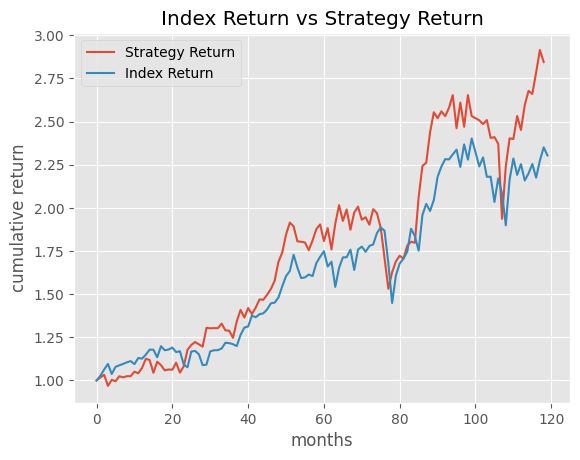

In [79]:
#visualization
fig, ax = plt.subplots()
plt.plot((1+pflio(return_df,6,3)).cumprod())
plt.plot((1+DJI["mon_ret"].reset_index(drop=True)).cumprod())
plt.title("Index Return vs Strategy Return")
plt.ylabel("cumulative return")
plt.xlabel("months")
ax.legend(["Strategy Return","Index Return"])

# Strategy 2: Resistance Breakout

**About Strategy:**

Resistance breakout is a well-known strategy where we see the price of the stock breaching a previous resistance level.

Our breakout rule in this case will be a price breaching 20 period rolling max/min price used
in conjunction with a volume breaching rolling maximum volume. 

Using this, we go long/short stocks based on the signal.

Additionally, we define exit/stop loss signal with a previous price plus/minus 20 period ATR as the rolling stop loss price.

Finally, we backtest the strategy and calculate the cumulative return for each stock.

In [80]:
import numpy as np
import pandas as pd
import copy

def ATR(DF,n):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    
    # Calculating High - Low value of current row
    df['H-L']=abs(df['High']-df['Low'])
    
    # Calculating High value of current row - Adjusted Close of previous row
    df['H-PC']=abs(df['High']-df['Close'].shift(1))
    
    # Calculating Low value of current row - Adjusted Close of previous row
    df['L-PC']=abs(df['Low']-df['Close'].shift(1))
    
    # Taking the max of the previous 3 values and making it True Range
    df['TR']=df[['H-L','H-PC','L-PC']].max(axis=1,skipna=False)
    
    # Calculates Average True Range
    df['ATR'] = df['TR'].ewm(span=n,adjust=False,min_periods=n).mean()
    
    # Drop the rest of the columns
    df2 = df.drop(['H-L','H-PC','L-PC'],axis=1)
    
    
    return df2['ATR']

def CAGR(DF):
    "function to calculate the Cumulative Annual Growth Rate of a trading strategy"
    df = DF.copy()
    
    # Calculating cumulative product return 
    df["cum_return"] = (1 + df["ret"]).cumprod()
    
    # There are 78,5-minute candle in a day and 252 days in a year
    n = len(df)/(252*78)
    
    # Calculate CAGR according to formula 
    CAGR = (df["cum_return"].tolist()[-1])**(1/n) - 1
    
    return CAGR

def volatility(DF):
    "function to calculate annualized volatility of a trading strategy"
    df = DF.copy()
    
    # Calculating volatility, the standard deviation of returns. This is annualized.
    vol = df["ret"].std() * np.sqrt(252*78)
    return vol

def sharpe(DF,rf):
    "function to calculate sharpe ratio ; rf is the risk free rate"
    df = DF.copy()
    sr = (CAGR(df) - rf)/volatility(df)
    return sr

def max_dd(DF):
    "function to calculate max drawdown"
    df = DF.copy()
    df["cum_return"] = (1 + df["ret"]).cumprod()
    df["cum_roll_max"] = df["cum_return"].cummax()
    df["drawdown"] = df["cum_roll_max"] - df["cum_return"]
    df["drawdown_pct"] = df["drawdown"]/df["cum_roll_max"]
    max_dd = df["drawdown_pct"].max()
    return max_dd

In [81]:
tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]

ohlc_intraday = {} # directory with ohlc value for each stock   

# looping over tickers and creating a dataframe with close prices
for ticker in tickers:
    ohlc_intraday[ticker] = yf.download(ticker,period="1mo",interval='5m')
    ohlc_intraday[ticker].dropna(inplace=True,how="all")

tickers = ohlc_intraday.keys()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [82]:
################################   Backtesting    ####################################

# calculating ATR and rolling max price for each stock and consolidating this info by stock in a separate dataframe

# OHLC dict is a deep copy of OHLC intraday to preserve orignal data and save time in running code again in case something wrong happens
ohlc_dict = copy.deepcopy(ohlc_intraday)

# Tickers_signal dictionary will have format like this: tickers_signal = {"MSFT":"buy", "AAPL":"", "INTC": "sell"}
tickers_signal = {}

# All KPIs work only when you have return as a seperate column
tickers_ret = {} 

for ticker in tickers:
    print("calculating ATR and rolling max price for ",ticker)
    # Calculating technical indicators
    ohlc_dict[ticker]["ATR"] = ATR(ohlc_dict[ticker],20)
    ohlc_dict[ticker]["roll_max_cp"] = ohlc_dict[ticker]["High"].rolling(20).max()
    ohlc_dict[ticker]["roll_min_cp"] = ohlc_dict[ticker]["Low"].rolling(20).min()
    ohlc_dict[ticker]["roll_max_vol"] = ohlc_dict[ticker]["Volume"].rolling(20).max()
    ohlc_dict[ticker].dropna(inplace=True)
    
    # Initially, there is no signal for those tickers
    tickers_signal[ticker] = ""
    
    # Creating a list to store ticker return
    tickers_ret[ticker] = [0]


calculating ATR and rolling max price for  MSFT
calculating ATR and rolling max price for  AAPL
calculating ATR and rolling max price for  META
calculating ATR and rolling max price for  AMZN
calculating ATR and rolling max price for  INTC
calculating ATR and rolling max price for  CSCO
calculating ATR and rolling max price for  VZ
calculating ATR and rolling max price for  IBM
calculating ATR and rolling max price for  QCOM
calculating ATR and rolling max price for  TSLA


In [ ]:
# identifying signals and calculating daily return (stop loss factored in)
for ticker in tickers:
    print("calculating returns for ",ticker)
    
    # Iterating over every single row of the dataframe for a particular ticker
    for i in range(1,len(ohlc_dict[ticker])):
        
        # This code block is concerning with assigning what is the signal
        # and updating the signal for that particular row
        
        if tickers_signal[ticker] == "":
            # No return if there is no signal/trade (for first row)
            tickers_ret[ticker].append(0)
            
            # Now, checking if for that particular candle, a new signal is created
            
            # Breakout happens when High touches rolling max price (is equal to) or is greater
            if ohlc_dict[ticker]["High"][i]>=ohlc_dict[ticker]["roll_max_cp"][i] and \
               ohlc_dict[ticker]["Volume"][i]>1.5*ohlc_dict[ticker]["roll_max_vol"][i-1]:
                #Need to use [i-1] here because if there is breakout, volume at i will be same as rolling max volume at i
                #Therefore, the below condition will never get satisfied
                tickers_signal[ticker] = "Buy"
                
            elif ohlc_dict[ticker]["Low"][i]<=ohlc_dict[ticker]["roll_min_cp"][i] and \
               ohlc_dict[ticker]["Volume"][i]>1.5*ohlc_dict[ticker]["roll_max_vol"][i-1]:
                tickers_signal[ticker] = "Sell"
                
        # This checks for a Buy signal
        elif tickers_signal[ticker] == "Buy":
            # Scenario  1: Stop loss criteria is met
            # If the Close price - previous ATR was breached, then change buy signal to no signal and close off the position
            # Here, we are revising stop loss level after every trade
            if ohlc_dict[ticker]["Low"][i]<ohlc_dict[ticker]["Close"][i-1] - ohlc_dict[ticker]["ATR"][i-1]:
                tickers_signal[ticker] = ""
                # Calculate the return of the trade
                # Assumption: You can fill your trade at stop loss point (Close price - ATR)
                # Take exit price divide by previous periods close price and you get the return for that particular candle
                tickers_ret[ticker].append(((ohlc_dict[ticker]["Close"][i-1] - ohlc_dict[ticker]["ATR"][i-1])/ohlc_dict[ticker]["Close"][i-1])-1)
                
            # Scenario 2: Stop loss doesn't get triggered but reversal gets triggered
            elif ohlc_dict[ticker]["Low"][i]<=ohlc_dict[ticker]["roll_min_cp"][i] and \
               ohlc_dict[ticker]["Volume"][i]>1.5*ohlc_dict[ticker]["roll_max_vol"][i-1]:
                tickers_signal[ticker] = "Sell"
                tickers_ret[ticker].append((ohlc_dict[ticker]["Close"][i]/ohlc_dict[ticker]["Close"][i-1])-1)
            
            else:
                tickers_ret[ticker].append((ohlc_dict[ticker]["Close"][i]/ohlc_dict[ticker]["Close"][i-1])-1)
                
        elif tickers_signal[ticker] == "Sell":
            if ohlc_dict[ticker]["High"][i]>ohlc_dict[ticker]["Close"][i-1] + ohlc_dict[ticker]["ATR"][i-1]:
                tickers_signal[ticker] = ""
                tickers_ret[ticker].append((ohlc_dict[ticker]["Close"][i-1]/(ohlc_dict[ticker]["Close"][i-1] + ohlc_dict[ticker]["ATR"][i-1]))-1)
            elif ohlc_dict[ticker]["High"][i]>=ohlc_dict[ticker]["roll_max_cp"][i] and \
               ohlc_dict[ticker]["Volume"][i]>1.5*ohlc_dict[ticker]["roll_max_vol"][i-1]:
                tickers_signal[ticker] = "Buy"
                tickers_ret[ticker].append((ohlc_dict[ticker]["Close"][i-1]/ohlc_dict[ticker]["Close"][i])-1)
            else:
                tickers_ret[ticker].append((ohlc_dict[ticker]["Close"][i-1]/ohlc_dict[ticker]["Close"][i])-1)
     
    # For each of these list, we convert them to numpy array and add them as new column to our dataframe
    ohlc_dict[ticker]["ret"] = np.array(tickers_ret[ticker])


In [ ]:
# calculating overall strategy's KPIs
strategy_df = pd.DataFrame()

# appending return of tickers to strategy dataframe
for ticker in tickers:
    strategy_df[ticker] = ohlc_dict[ticker]["ret"]

# As trader, you have certain amount of capital and you allocate equal capital to each of the trade
# And only when you get the signal, you allocate $X to the stock. Rest stay unallocated.

# Because capital is allocated equally, mean of these returns are taken. 
strategy_df["ret"] = strategy_df.mean(axis=1)
CAGR(strategy_df)
sharpe(strategy_df,0.025)
max_dd(strategy_df)

# vizualization of strategy return
(1+strategy_df["ret"]).cumprod().plot()

#calculating individual stock's KPIs
cagr = {}
sharpe_ratios = {}
max_drawdown = {}
for ticker in tickers:
    print("calculating KPIs for ",ticker)      
    cagr[ticker] =  CAGR(ohlc_dict[ticker])
    sharpe_ratios[ticker] =  sharpe(ohlc_dict[ticker],0.025)
    max_drawdown[ticker] =  max_dd(ohlc_dict[ticker])

KPI_df = pd.DataFrame([cagr,sharpe_ratios,max_drawdown],index=["Return","Sharpe Ratio","Max Drawdown"])      
KPI_df.T

# Strategy 3 - Renko & OBV

**About Strategy:**

In this strategy, we use a combination of Renko charts and OBV indicator.

Our buy signal has the following conditions:
1) Renko bar >= 2
2) 5 day OBV slope > 30 degrees
3) Exit if Renko bar < 2

Our sell signal has the following conditions:
1) Renko bar <= -2
2) 5 day OBV slope < -30 degrees
3) Exit if Renko bar > -2

In [ ]:
def ATR(DF,n):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    df['H-L']=abs(df['High']-df['Low'])
    df['H-PC']=abs(df['High']-df['Adj Close'].shift(1))
    df['L-PC']=abs(df['Low']-df['Adj Close'].shift(1))
    df['TR']=df[['H-L','H-PC','L-PC']].max(axis=1,skipna=False)
    df['ATR'] = df['TR'].rolling(n).mean()
    #df['ATR'] = df['TR'].ewm(span=n,adjust=False,min_periods=n).mean()
    df2 = df.drop(['H-L','H-PC','L-PC'],axis=1)
    return df2

def slope(ser,n):
    "function to calculate the slope of n consecutive points on a plot"
    "ser is the OBV dataframe"
    
    # initializing a list of slopes
    slopes = [i*0 for i in range(n-1)]
    
    # calculating for loop from n till end of ser
    for i in range(n,len(ser)+1):
        # rolling window of n values
        y = ser[i-n:i]
        
        # x can be anything as its time series
        x = np.array(range(n))
        
        # scaling y and x so it better fits our OLS
        y_scaled = (y - y.min())/(y.max() - y.min())
        x_scaled = (x - x.min())/(x.max() - x.min())
        
        # Adding constant "+ c" to make it y = mx + c form
        x_scaled = sm.add_constant(x_scaled)
        
        # Using OLS regression
        model = sm.OLS(y_scaled,x_scaled)
        
        # fitting model
        results = model.fit()
        
        # appending the slope to the last place in list
        slopes.append(results.params[-1])
        
    # Calculating slope angle
    slope_angle = (np.rad2deg(np.arctan(np.array(slopes))))
    return np.array(slope_angle)

def renko_DF(DF):
    "function to convert ohlc data into renko bricks"
    df = DF.copy()
    df.reset_index(inplace=True)
    df = df.iloc[:,[0,1,2,3,4,5]]
    df.columns = ["date","open","high","low","close","volume"]
    df2 = Renko(df)
    df2.brick_size = max(0.5,round(ATR(DF,120)["ATR"][-1],0))
    renko_df = df2.get_ohlc_data()
    
    # Annotating columns with +1 and -1
    renko_df["bar_num"] = np.where(renko_df["uptrend"]==True,1,np.where(renko_df["uptrend"]==False,-1,0))
    
    # Calculating the number of bars of the renko chart so far (if previous number is positive, add. If previous number is negative, subtract)
    for i in range(1,len(renko_df["bar_num"])):
        if renko_df["bar_num"][i]>0 and renko_df["bar_num"][i-1]>0:
            renko_df["bar_num"][i]+=renko_df["bar_num"][i-1]
        elif renko_df["bar_num"][i]<0 and renko_df["bar_num"][i-1]<0:
            renko_df["bar_num"][i]+=renko_df["bar_num"][i-1]
    
    # Removes all duplicate row values and keeping the last row value
    renko_df.drop_duplicates(subset="date",keep="last",inplace=True)
    return renko_df

def OBV(DF):
    """function to calculate On Balance Volume"""
    df = DF.copy()
    df['daily_ret'] = df['Adj Close'].pct_change()
    df['direction'] = np.where(df['daily_ret']>=0,1,-1)
    df['direction'][0] = 0
    df['vol_adj'] = df['Volume'] * df['direction']
    df['obv'] = df['vol_adj'].cumsum()
    return df['obv']

def CAGR(DF):
    "function to calculate the Cumulative Annual Growth Rate of a trading strategy"
    df = DF.copy()
    df["cum_return"] = (1 + df["ret"]).cumprod()
    n = len(df)/(252*78)
    CAGR = (df["cum_return"].tolist()[-1])**(1/n) - 1
    return CAGR

def volatility(DF):
    "function to calculate annualized volatility of a trading strategy"
    df = DF.copy()
    vol = df["ret"].std() * np.sqrt(252*78)
    return vol

def sharpe(DF,rf):
    "function to calculate sharpe ratio ; rf is the risk free rate"
    df = DF.copy()
    sr = (CAGR(df) - rf)/volatility(df)
    return sr
    
def max_dd(DF):
    "function to calculate max drawdown"
    df = DF.copy()
    df["cum_return"] = (1 + df["ret"]).cumprod()
    df["cum_roll_max"] = df["cum_return"].cummax()
    df["drawdown"] = df["cum_roll_max"] - df["cum_return"]
    df["drawdown_pct"] = df["drawdown"]/df["cum_roll_max"]
    max_dd = df["drawdown_pct"].max()
    return max_dd

In [ ]:
tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]

ohlc_intraday = {} # directory with ohlc value for each stock   

# looping over tickers and creating a dataframe with close prices
for ticker in tickers:
    ohlc_intraday[ticker] = yf.download(ticker,period="1mo",interval='5m')
    ohlc_intraday[ticker].dropna(inplace=True,how="all")

tickers = ohlc_intraday.keys()

In [ ]:
################################Backtesting####################################

# Merging renko df with original ohlc df
ohlc_renko = {}
df = copy.deepcopy(ohlc_intraday)
tickers_signal = {}
tickers_ret = {}

for ticker in tickers:
    print("merging for ",ticker)
    renko = renko_DF(df[ticker])
    renko.columns = ["Date","open","high","low","close","uptrend","bar_num"]
    # New column date which is the index 
    df[ticker]["Date"] = df[ticker].index
    # Perform outer merge on date column. Just merging bar_num and date as rest are same.
    ohlc_renko[ticker] = df[ticker].merge(renko.loc[:,["Date","bar_num"]],how="outer",on="Date")
    # forward filling NaN values
    ohlc_renko[ticker]["bar_num"].fillna(method='ffill',inplace=True)
    ohlc_renko[ticker]["obv"]= OBV(ohlc_renko[ticker])
    ohlc_renko[ticker]["obv_slope"]= slope(ohlc_renko[ticker]["obv"],5)
    tickers_signal[ticker] = ""
    tickers_ret[ticker] = []

       
#Identifying signals and calculating daily return
for ticker in tickers:
    print("calculating daily returns for ",ticker)
    for i in range(len(ohlc_intraday[ticker])):
        if tickers_signal[ticker] == "":
            tickers_ret[ticker].append(0)
            if ohlc_renko[ticker]["bar_num"][i]>=2 and ohlc_renko[ticker]["obv_slope"][i]>30:
                tickers_signal[ticker] = "Buy"
            elif ohlc_renko[ticker]["bar_num"][i]<=-2 and ohlc_renko[ticker]["obv_slope"][i]<-30:
                tickers_signal[ticker] = "Sell"
        
        elif tickers_signal[ticker] == "Buy":
            tickers_ret[ticker].append((ohlc_renko[ticker]["Adj Close"][i]/ohlc_renko[ticker]["Adj Close"][i-1])-1)
            if ohlc_renko[ticker]["bar_num"][i]<=-2 and ohlc_renko[ticker]["obv_slope"][i]<-30:
                tickers_signal[ticker] = "Sell"
            elif ohlc_renko[ticker]["bar_num"][i]<2:
                tickers_signal[ticker] = ""
                
        elif tickers_signal[ticker] == "Sell":
            tickers_ret[ticker].append((ohlc_renko[ticker]["Adj Close"][i-1]/ohlc_renko[ticker]["Adj Close"][i])-1)
            if ohlc_renko[ticker]["bar_num"][i]>=2 and ohlc_renko[ticker]["obv_slope"][i]>30:
                tickers_signal[ticker] = "Buy"
            elif ohlc_renko[ticker]["bar_num"][i]>-2:
                tickers_signal[ticker] = ""
    ohlc_renko[ticker]["ret"] = np.array(tickers_ret[ticker])

In [ ]:
#calculating overall strategy's KPIs
strategy_df = pd.DataFrame()
for ticker in tickers:
    strategy_df[ticker] = ohlc_renko[ticker]["ret"]
strategy_df["ret"] = strategy_df.mean(axis=1)
CAGR(strategy_df)
sharpe(strategy_df,0.025)
max_dd(strategy_df)  

In [ ]:
#visualizing strategy returns
(1+strategy_df["ret"]).cumprod().plot()

In [ ]:
#calculating individual stock's KPIs
cagr = {}
sharpe_ratios = {}
max_drawdown = {}
for ticker in tickers:
    print("calculating KPIs for ",ticker)      
    cagr[ticker] =  CAGR(ohlc_renko[ticker])
    sharpe_ratios[ticker] =  sharpe(ohlc_renko[ticker],0.025)
    max_drawdown[ticker] =  max_dd(ohlc_renko[ticker])


In [ ]:
KPI_df = pd.DataFrame([cagr,sharpe_ratios,max_drawdown],index=["Return","Sharpe Ratio","Max Drawdown"])      
KPI_df.T

# Strategy 4 - Renko & MACD

If value of MACD is greater than value of signal line

and short-term slope of MACD is greater than slope of signal line

**About Strategy:**

In this strategy, we will use a combination of Renko charts and the MACD indicator.

Our buy signal has the following conditions:
1) Renko bar >= 2
2) MACD line is above signal line
3) MACD line's slope > signal line's slope (calculated over last 5 periods)
4) Exit when MACD line < signal line AND MACD line slope < signal line's slope

Our sell signal has the following conditions:
1) Renko bar <= -2
2) MACD line is below signal line
3) MACD line's slope < signal line's slope (over last 5 periods)
4) We exit when MACD line is above signal line AND MACD line's slope is greater than signal line's slope

In [ ]:
def MACD(DF,a,b,c):
    """function to calculate MACD
       typical values a = 12; b =26, c =9"""
    df = DF.copy()
    df["MA_Fast"]=df["Adj Close"].ewm(span=a,min_periods=a).mean()
    df["MA_Slow"]=df["Adj Close"].ewm(span=b,min_periods=b).mean()
    df["MACD"]=df["MA_Fast"]-df["MA_Slow"]
    df["Signal"]=df["MACD"].ewm(span=c,min_periods=c).mean()
    df.dropna(inplace=True)
    return (df["MACD"],df["Signal"])

def ATR(DF,n):
    "function to calculate True Range and Average True Range"
    df = DF.copy()
    df['H-L']=abs(df['High']-df['Low'])
    df['H-PC']=abs(df['High']-df['Adj Close'].shift(1))
    df['L-PC']=abs(df['Low']-df['Adj Close'].shift(1))
    df['TR']=df[['H-L','H-PC','L-PC']].max(axis=1,skipna=False)
    df['ATR'] = df['TR'].rolling(n).mean()
    #df['ATR'] = df['TR'].ewm(span=n,adjust=False,min_periods=n).mean()
    df2 = df.drop(['H-L','H-PC','L-PC'],axis=1)
    return df2

def slope(ser,n):
    "function to calculate the slope of n consecutive points on a plot"
    slopes = [i*0 for i in range(n-1)]
    for i in range(n,len(ser)+1):
        y = ser[i-n:i]
        x = np.array(range(n))
        y_scaled = (y - y.min())/(y.max() - y.min())
        x_scaled = (x - x.min())/(x.max() - x.min())
        x_scaled = sm.add_constant(x_scaled)
        model = sm.OLS(y_scaled,x_scaled)
        results = model.fit()
        slopes.append(results.params[-1])
    slope_angle = (np.rad2deg(np.arctan(np.array(slopes))))
    return np.array(slope_angle)

def renko_DF(DF):
    "function to convert ohlc data into renko bricks"
    df = DF.copy()
    df.reset_index(inplace=True)
    df = df.iloc[:,[0,1,2,3,4,5]]
    df.columns = ["date","open","high","low","close","volume"]
    df2 = Renko(df)
    df2.brick_size = max(0.5,round(ATR(DF,120)["ATR"][-1],0))
    renko_df = df2.get_ohlc_data()
    renko_df["bar_num"] = np.where(renko_df["uptrend"]==True,1,np.where(renko_df["uptrend"]==False,-1,0))
    for i in range(1,len(renko_df["bar_num"])):
        if renko_df["bar_num"][i]>0 and renko_df["bar_num"][i-1]>0:
            renko_df["bar_num"][i]+=renko_df["bar_num"][i-1]
        elif renko_df["bar_num"][i]<0 and renko_df["bar_num"][i-1]<0:
            renko_df["bar_num"][i]+=renko_df["bar_num"][i-1]
    renko_df.drop_duplicates(subset="date",keep="last",inplace=True)
    return renko_df


def CAGR(DF):
    "function to calculate the Cumulative Annual Growth Rate of a trading strategy"
    df = DF.copy()
    df["cum_return"] = (1 + df["ret"]).cumprod()
    n = len(df)/(252*78)
    CAGR = (df["cum_return"].tolist()[-1])**(1/n) - 1
    return CAGR

def volatility(DF):
    "function to calculate annualized volatility of a trading strategy"
    df = DF.copy()
    vol = df["ret"].std() * np.sqrt(252*78)
    return vol

def sharpe(DF,rf):
    "function to calculate sharpe ratio ; rf is the risk free rate"
    df = DF.copy()
    sr = (CAGR(df) - rf)/volatility(df)
    return sr
    
def max_dd(DF):
    "function to calculate max drawdown"
    df = DF.copy()
    df["cum_return"] = (1 + df["ret"]).cumprod()
    df["cum_roll_max"] = df["cum_return"].cummax()
    df["drawdown"] = df["cum_roll_max"] - df["cum_return"]
    df["drawdown_pct"] = df["drawdown"]/df["cum_roll_max"]
    max_dd = df["drawdown_pct"].max()
    return max_dd

In [ ]:
tickers = ["MSFT","AAPL","META","AMZN","INTC", "CSCO","VZ","IBM","QCOM","TSLA"]

ohlc_intraday = {} # directory with ohlc value for each stock   

# looping over tickers and creating a dataframe with close prices
for ticker in tickers:
    ohlc_intraday[ticker] = yf.download(ticker,period="1mo",interval='5m')
    ohlc_intraday[ticker].dropna(inplace=True,how="all")

tickers = ohlc_intraday.keys()

In [ ]:
################################Backtesting####################################

#Merging renko df with original ohlc df
ohlc_renko = {}
df = copy.deepcopy(ohlc_intraday)
tickers_signal = {}
tickers_ret = {}
for ticker in tickers:
    print("merging for ",ticker)
    renko = renko_DF(df[ticker])
    renko.columns = ["Date","open","high","low","close","uptrend","bar_num"]
    df[ticker]["Date"] = df[ticker].index
    ohlc_renko[ticker] = df[ticker].merge(renko.loc[:,["Date","bar_num"]],how="outer",on="Date")
    ohlc_renko[ticker]["bar_num"].fillna(method='ffill',inplace=True)
    ohlc_renko[ticker]["macd"]= MACD(ohlc_renko[ticker],12,26,9)[0]
    ohlc_renko[ticker]["macd_sig"]= MACD(ohlc_renko[ticker],12,26,9)[1]
    ohlc_renko[ticker]["macd_slope"] = slope(ohlc_renko[ticker]["macd"],5)
    ohlc_renko[ticker]["macd_sig_slope"] = slope(ohlc_renko[ticker]["macd_sig"],5)
    tickers_signal[ticker] = ""
    tickers_ret[ticker] = []
    
#Identifying signals and calculating daily return
for ticker in tickers:
    print("calculating daily returns for ",ticker)
    for i in range(len(ohlc_intraday[ticker])):
        if tickers_signal[ticker] == "":
            tickers_ret[ticker].append(0)
            if i > 0:
                if ohlc_renko[ticker]["bar_num"][i]>=2 and ohlc_renko[ticker]["macd"][i]>ohlc_renko[ticker]["macd_sig"][i] and ohlc_renko[ticker]["macd_slope"][i]>ohlc_renko[ticker]["macd_sig_slope"][i]:
                    tickers_signal[ticker] = "Buy"
                elif ohlc_renko[ticker]["bar_num"][i]<=-2 and ohlc_renko[ticker]["macd"][i]<ohlc_renko[ticker]["macd_sig"][i] and ohlc_renko[ticker]["macd_slope"][i]<ohlc_renko[ticker]["macd_sig_slope"][i]:
                    tickers_signal[ticker] = "Sell"
        
        elif tickers_signal[ticker] == "Buy":
            tickers_ret[ticker].append((ohlc_renko[ticker]["Adj Close"][i]/ohlc_renko[ticker]["Adj Close"][i-1])-1)
            if i > 0:
                if ohlc_renko[ticker]["bar_num"][i]<=-2 and ohlc_renko[ticker]["macd"][i]<ohlc_renko[ticker]["macd_sig"][i] and ohlc_renko[ticker]["macd_slope"][i]<ohlc_renko[ticker]["macd_sig_slope"][i]:
                    tickers_signal[ticker] = "Sell"
                    
                # Not taking renko into account for exit criteria
                elif ohlc_renko[ticker]["macd"][i]<ohlc_renko[ticker]["macd_sig"][i] and ohlc_renko[ticker]["macd_slope"][i]<ohlc_renko[ticker]["macd_sig_slope"][i]:
                    tickers_signal[ticker] = ""
        
        elif tickers_signal[ticker] == "Sell":
            tickers_ret[ticker].append((ohlc_renko[ticker]["Adj Close"][i-1]/ohlc_renko[ticker]["Adj Close"][i])-1)
            if i > 0:
                if ohlc_renko[ticker]["bar_num"][i]>=2 and ohlc_renko[ticker]["macd"][i]>ohlc_renko[ticker]["macd_sig"][i] and ohlc_renko[ticker]["macd_slope"][i]>ohlc_renko[ticker]["macd_sig_slope"][i]:
                    tickers_signal[ticker] = "Buy"
                elif ohlc_renko[ticker]["macd"][i]>ohlc_renko[ticker]["macd_sig"][i] and ohlc_renko[ticker]["macd_slope"][i]>ohlc_renko[ticker]["macd_sig_slope"][i]:
                    tickers_signal[ticker] = ""
    
    # Converting dictionary into dataframe
    ohlc_renko[ticker]["ret"] = np.array(tickers_ret[ticker])

In [ ]:
#calculating overall strategy's KPIs
strategy_df = pd.DataFrame()
for ticker in tickers:
    strategy_df[ticker] = ohlc_renko[ticker]["ret"]
strategy_df["ret"] = strategy_df.mean(axis=1)
CAGR(strategy_df)
sharpe(strategy_df,0.025)
max_dd(strategy_df)  

In [ ]:
#visualizing strategy returns
(1+strategy_df["ret"]).cumprod().plot()

In [ ]:
#calculating individual stock's KPIs
cagr = {}
sharpe_ratios = {}
max_drawdown = {}
for ticker in tickers:
    print("calculating KPIs for ",ticker)      
    cagr[ticker] =  CAGR(ohlc_renko[ticker])
    sharpe_ratios[ticker] =  sharpe(ohlc_renko[ticker],0.025)
    max_drawdown[ticker] =  max_dd(ohlc_renko[ticker])

KPI_df = pd.DataFrame([cagr,sharpe_ratios,max_drawdown],index=["Return","Sharpe Ratio","Max Drawdown"])      
KPI_df.T